In [1]:
import matplotlib.pyplot as plt
import numpy

from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


Tasks #1. 
First I am doing the segmentation for the Scanner. Before we can start, we need to do the white correction.

In [2]:
# read dir and search for WHITE, DARK and OBJECT (RAW and HDR)
import os
def readDir(dir_path):
    myDir = os.listdir(dir_path)
    dark_hdr =[]
    dark_raw=[]
    white_hdr=[]
    white_raw=[]
    for file in myDir:
        if 'dark' in file.lower() and 'hdr' in file.lower():
            #dark_hdr = dir_path + '/' + file
            dark_hdr = os.path.join(dir_path, file)
        if 'dark' in file.lower() and 'raw' in file.lower():
            #dark_raw = dir_path + '/' + file
            dark_raw = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'hdr' in file.lower():
            #white_hdr = dir_path + '/' + file
            white_hdr = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'raw' in file.lower():
            #white_raw = dir_path + '/' + file
            white_raw = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'hdr' in file.lower():
            #object_hdr = dir_path + '/' + file
            object_hdr = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'raw' in file.lower():
            #object_raw = dir_path + '/' + file
            object_raw = os.path.join(dir_path, file)
    return object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr  
import os
import numpy

##### Read HDR content
def read_hdr(hdr_path):
    f=open(hdr_path, "r")
    filelines = f.readlines()
    #print(filelines)
    f.close()
    bands = ''
    for fileline in filelines:
        #print(fileline)
        if 'samples' in fileline.lower():
            samples = int(fileline.replace('samples = ',''))
            print(samples)
        if bands =='' and 'bands' in fileline.lower():
            bands = int(fileline.replace('bands = ',''))
        if 'lines' in fileline.lower():
            lines = int(fileline.replace('lines = ',''))
    # read waves   
    print(samples, lines, bands)
    n = 0
    for fileline in filelines:
        if 'th = {' in fileline.lower():
          print(n)
          n1 = n+1
        n = n + 1
    n2 = n1 + bands
    print(n1)
    print(n2)
    waves = numpy.zeros(n2-n1,)
    n = 0
    for i in range(n1, n2):
        #print(filelines[i])
        waves[n] = float(filelines[i].replace(',',''))
        #print(waves[n])
        n = n + 1
    
    return samples, bands, lines, waves     




'path' is a path to 'capture' folder
the code reads 'spectral_image'

/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture/vis_scan_0069.raw
2144
2144 3173 135
54
55
190
spectral_image.shape:  (3173, 135, 2144)
/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture/WHITEREF_vis_scan_0069.hdr
2144
2144 151 135
54
55
190
2144 135 151


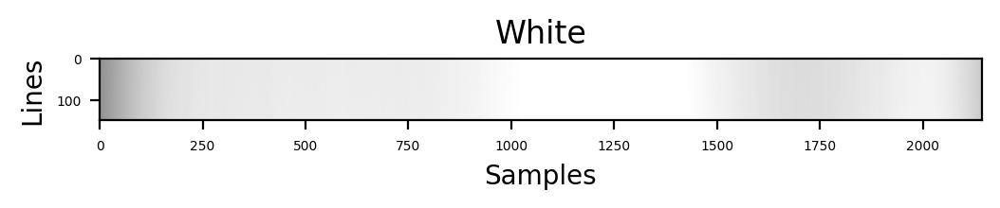

2144
2144 100 135
54
55
190


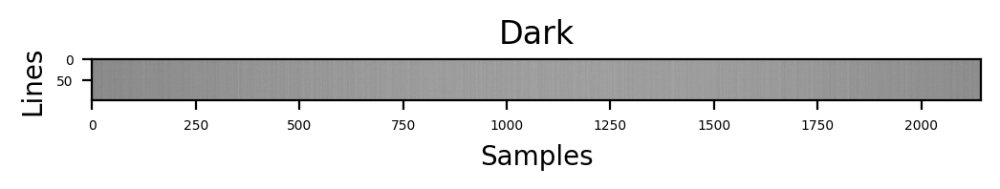

In [3]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=250)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=2)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [4]:


white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube


(3173, 135, 2144)


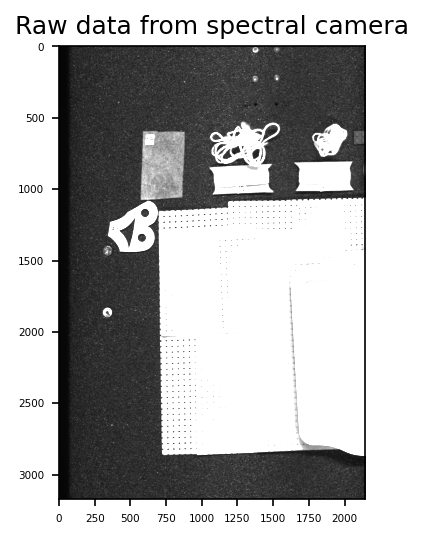

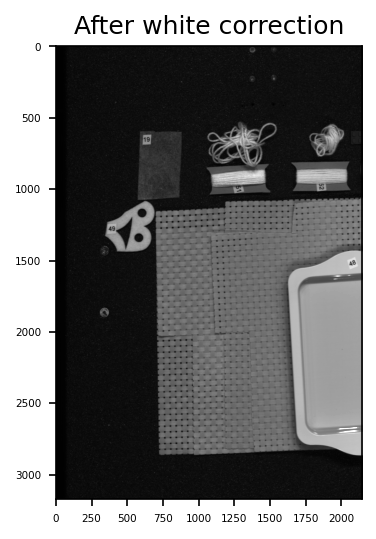

In [5]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()




671.02
544.7
445.52


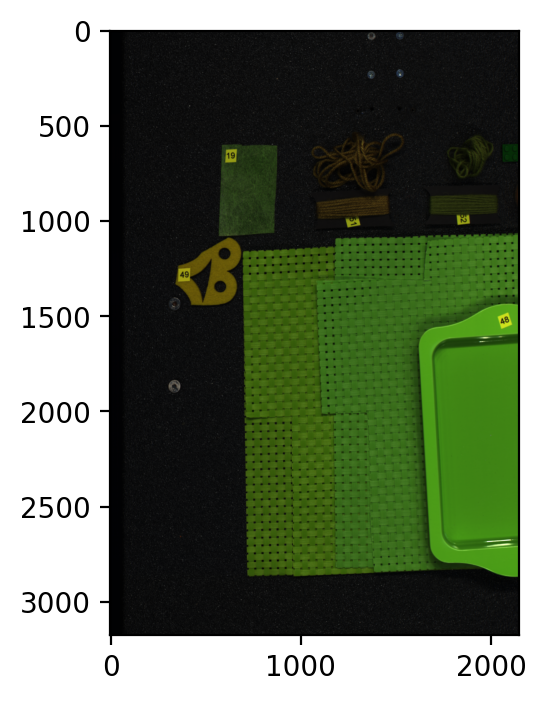

In [6]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 70
ch_2 = 45
ch_3 = 25
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB)

plt.show()

The white correction is done. Next, we can select an area we want to segment.

[0.05384982 0.05020869 0.06134208]


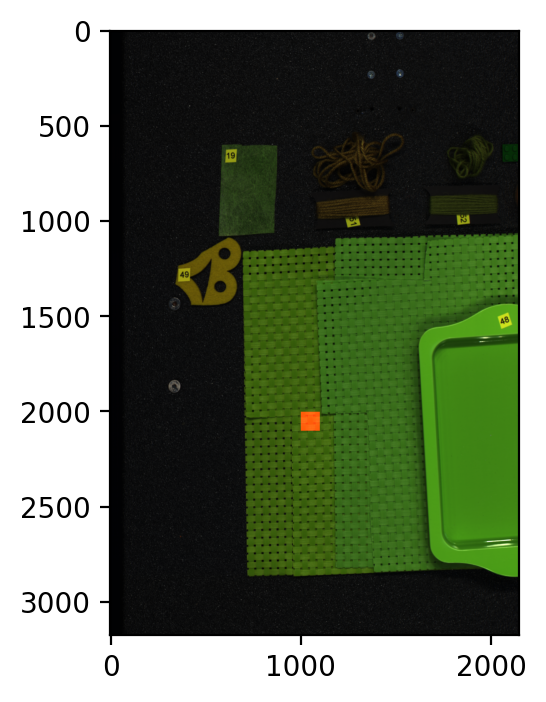

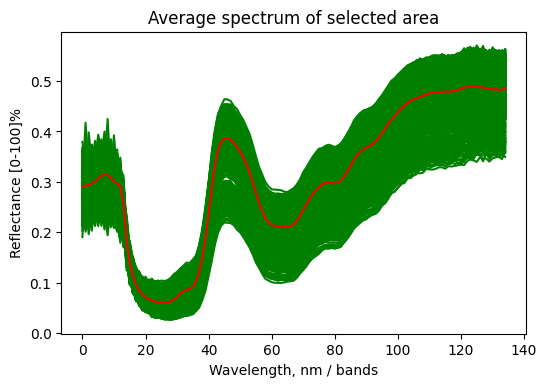

In [8]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################

# Sample 
x1 = 2000
x2 = 2100
y1 = 1000
y2 = 1100

plt.rcParams['figure.dpi'] = 200

RGB2[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB2)
plt.rcParams['figure.dpi'] = 100
plt.show()

for i in range(20):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)

plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")


plt.show()

# save 
saveraw = "/content/drive/MyDrive/green_image0001.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()




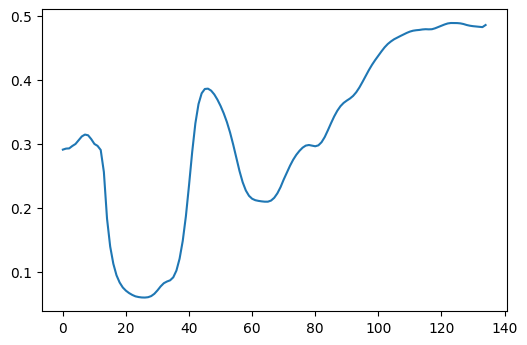

In [9]:
open_path = "/content/drive/MyDrive/green_image0001.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

I want to segment the green mats from the other green objects.

3173 135 2144
20
43
70
120
RGB:  (3173, 2144, 3)
cube:  (3173, 135, 2144)
small cube:  (3173, 2144, 4)


1.9821227
1.5330561
1.9029775


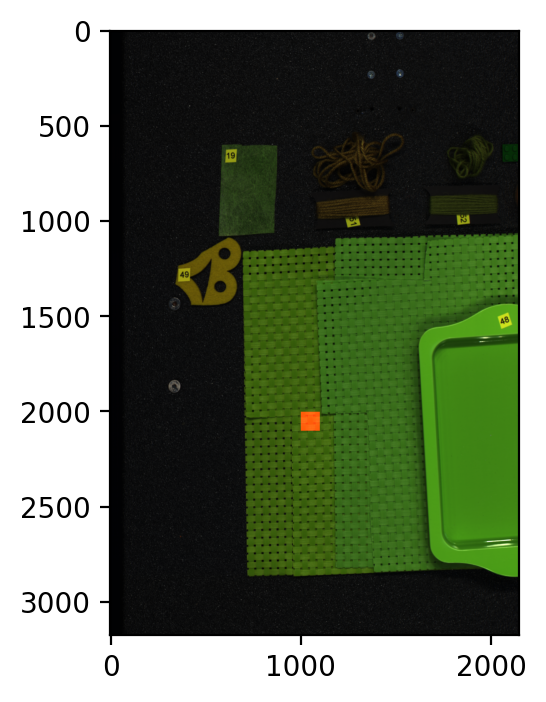

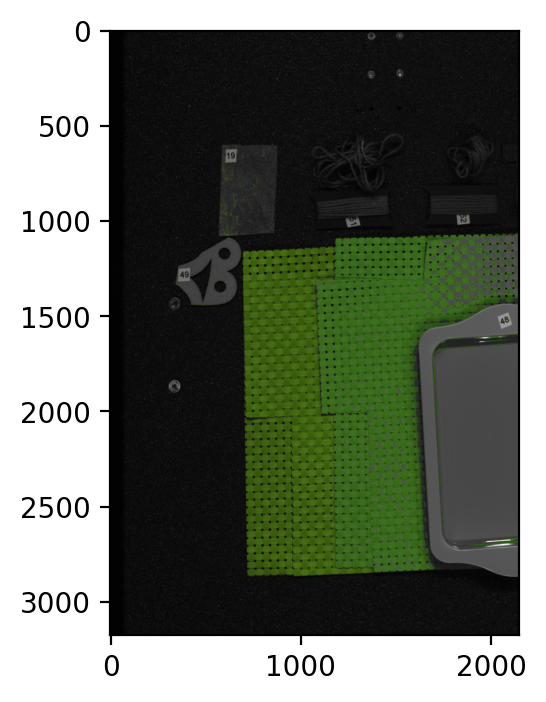

In [13]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 43
bbands[2] = 70
bbands[3] = 120


# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/green_image0001.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.09: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB2)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()
plt.imshow(mask)


The segmentation was successfull. The green mats are segmented from the rest. 
Next, I will do the segmentation for green samples of the Specim IQ camera. Like before, we start with the white correction. 

In [14]:
# Read wavelengths from hdr file
hdr_path = "/content/drive/MyDrive/Group3 session 2/[Specim IQ]/Green samples/capture/406.hdr"
f=open(hdr_path, "r")
filelines = f.readlines()
#print(filelines)
f.close()
waves = numpy.zeros(135,)
n = 0
for i in range(55, 55+135):
  #print(filelines[i])
  waves[n] = float(filelines[i].replace(',',''))
  #print(waves[n])
  n = n + 1


In [15]:
# Read image
open_path = "/content/drive/MyDrive/Group3 session 2/[Specim IQ]/Green samples/capture/406.raw"
samples = 512
bands = 204
lines = 512

# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) 
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))

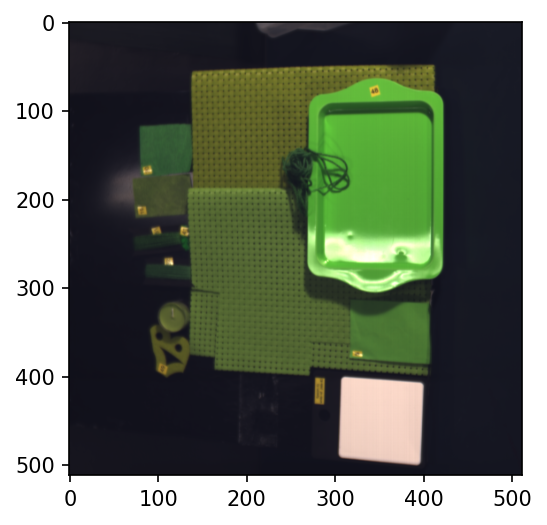

In [17]:
# Plot RGB preview
plt.rcParams['figure.dpi'] = 100
RGB = numpy.empty((lines,samples, 3), dtype = numpy.float32)
ch1 = 68 # Red
ch2 = 45  # Green
ch3 = 25  # Blue
RGB[:,:,0] = spectral_image[:,ch1,:]/ numpy.amax(spectral_image[:,ch1,:])
RGB[:,:,1] = spectral_image[:,ch2,:]/ numpy.amax(spectral_image[:,ch2,:])
RGB[:,:,2] = spectral_image[:,ch3,:]/ numpy.amax(spectral_image[:,ch3,:])
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.show()

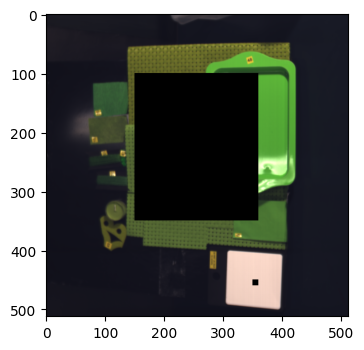

In [18]:
# Select Green
y1 = 100
y2 = 350
x1 = 150
x2 = 360
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
green = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))

# Select White
y1 = 450
y2 = 460
x1 = 350
x2 = 360
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
white = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
##################################################################
plt.rcParams['figure.dpi'] = 100
plt.imshow(RGB)
plt.show()

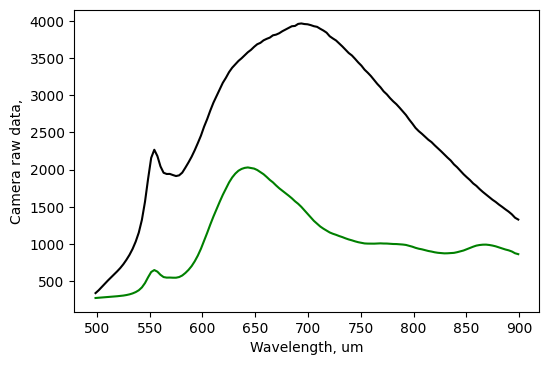

In [19]:
plt.plot(waves, green[:135], "g")
plt.plot(waves, white[:135], "black")

plt.rcParams['figure.dpi'] = 150
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
#plt.ylabel('Reflectance [0-100]%')
plt.show()

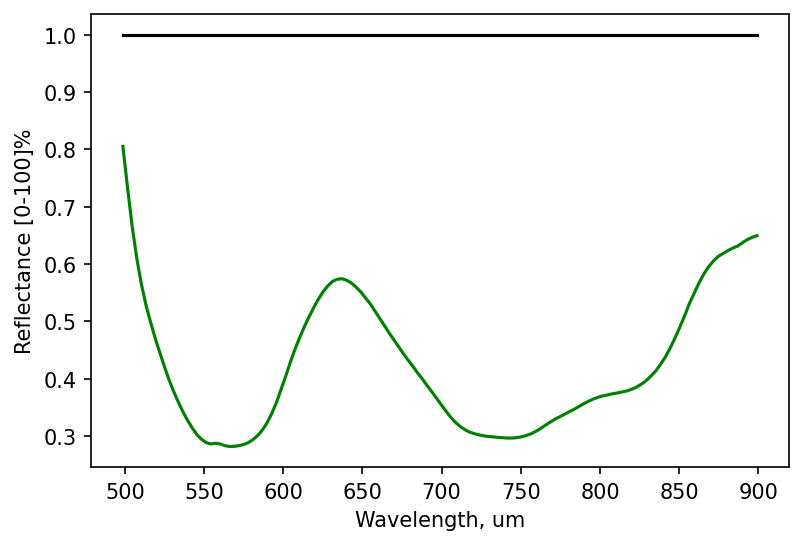

In [21]:
# spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
green_cor = green/white
white_cor = white/white
plt.rcParams['figure.dpi'] = 150

plt.plot(waves, green_cor[:135], "g")
plt.plot(waves, white_cor[:135], "black")
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
plt.ylabel('Reflectance [0-100]%')
plt.show()

In [22]:
# Correct all image
spectral_cube = numpy.empty((lines,bands,samples), dtype = numpy.float32)
for i in range(0,lines):
  for j in range(0,samples):
    spectral_cube[i,:,j] = spectral_image[i,:,j]/white #numpy.divide(spectral_image[i,:,j], white)

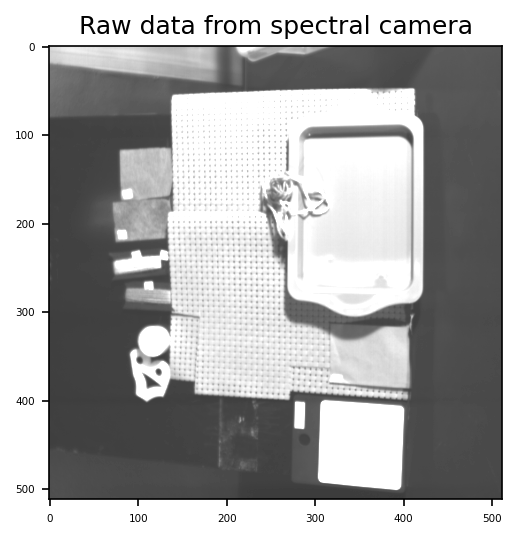

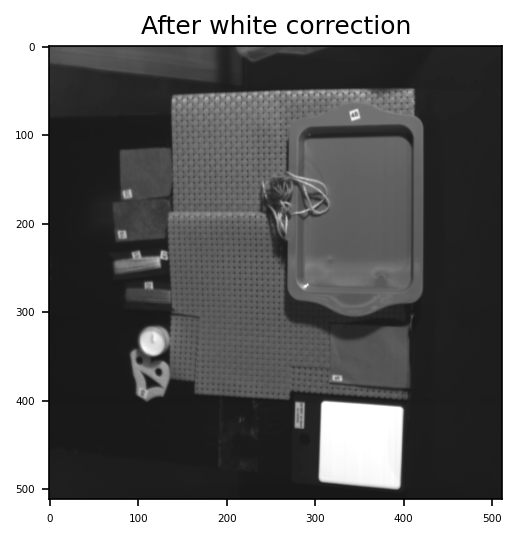

In [23]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=1050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


699.6
631.15
572.07


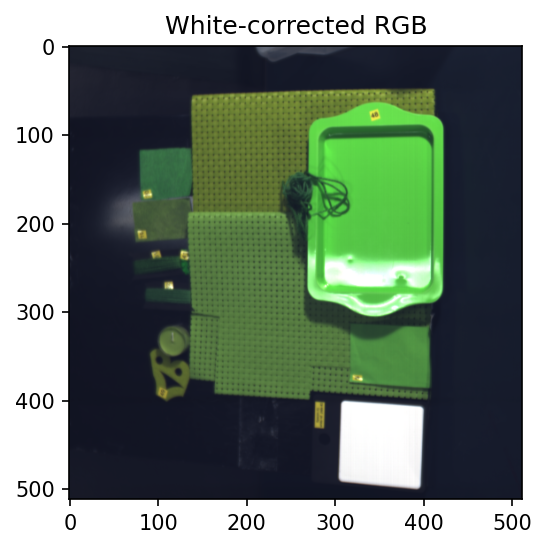

In [25]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 68
ch_2 = 45
ch_3 = 25
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.title("White-corrected RGB")
plt.show()

Like before, now we can select an area, we want to segment. Again I want to segment the green mats.

[0.07993504 0.09137288 0.14797047]


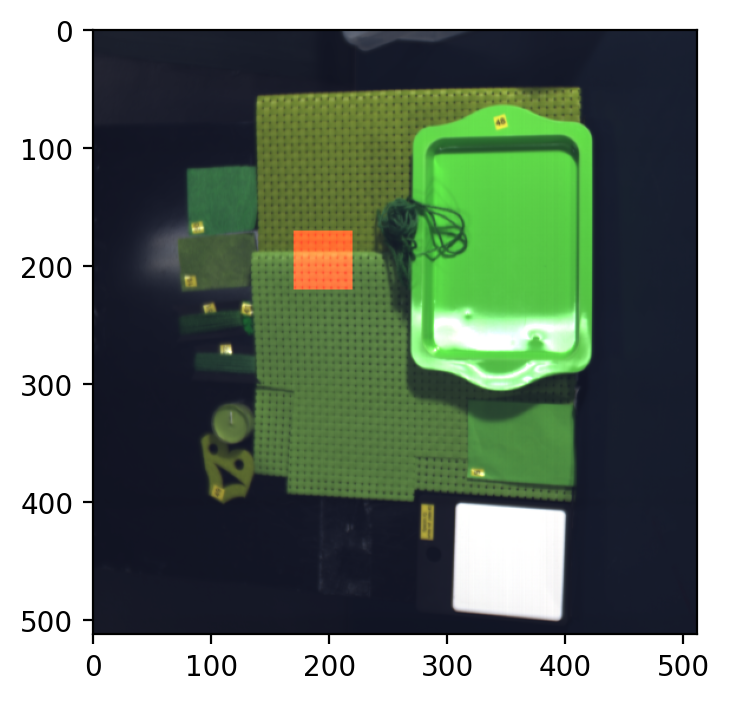

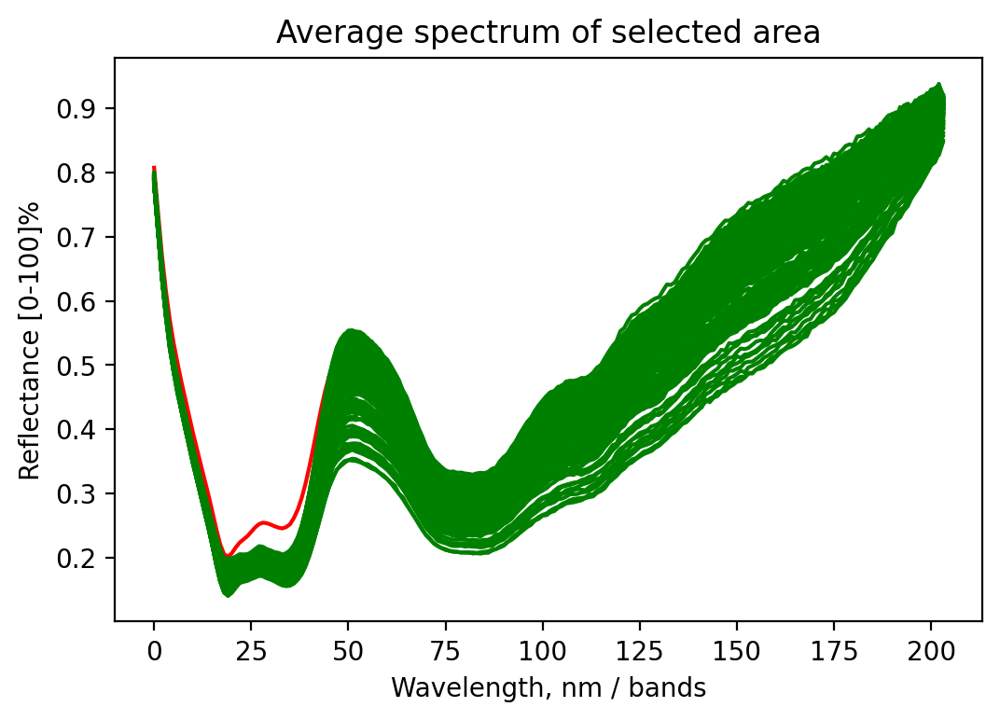

In [33]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB3 = RGB.copy()
##################################################################

# Sample 
x1 = 170
x2 = 220
y1 = 170
y2 = 220


plt.rcParams['figure.dpi'] = 200

RGB3[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB3)
plt.rcParams['figure.dpi'] = 200
plt.show()


plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")

for i in range(5):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)

plt.show()

# save 
saveraw = "/content/drive/MyDrive/green2_image.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()




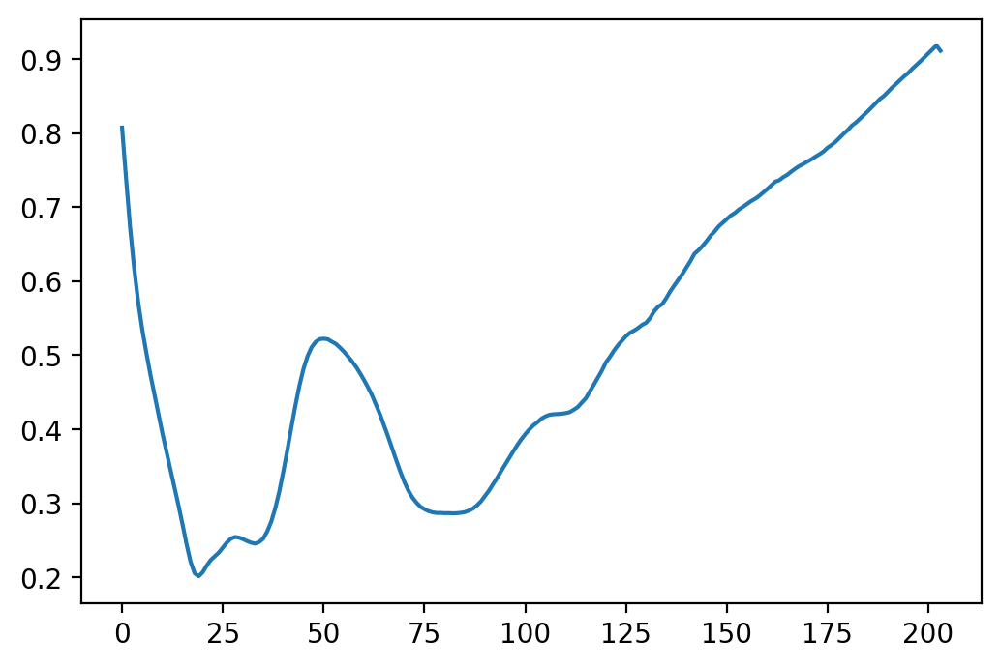

In [34]:
open_path = "/content/drive/MyDrive/green2_image.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

512 204 512
25
50
80
175
RGB:  (512, 512, 3)
cube:  (512, 204, 512)
small cube:  (512, 512, 4)


1.7035859
1.1749386
1.2896794


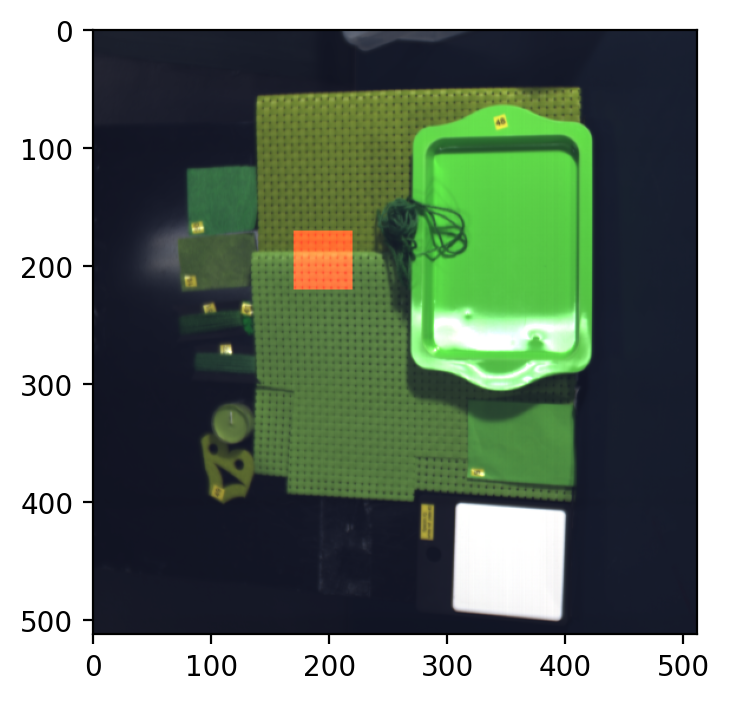

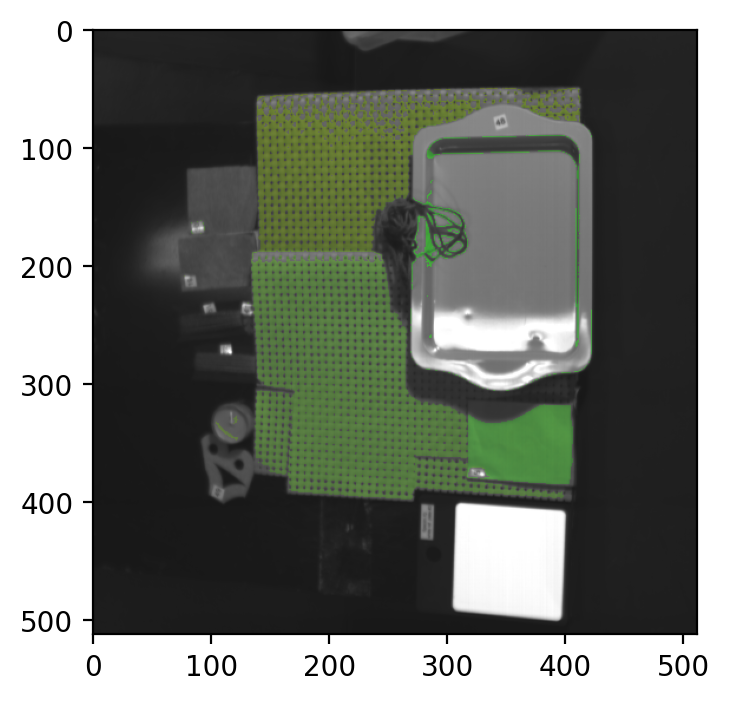

In [37]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 25
bbands[1] = 50
bbands[2] = 80
bbands[3] = 175

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/green2_image.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.07: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB3)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()
plt.imshow(mask)


This time the segmenatation was still good but the green paper was worngly segmented. This time I did the white correction including multiple green objects and also selected 2 green mats for segmentation. Maybe that influenced the result. 

Next, I will do the segmentation with the tunable files. As always, we start by doing the white correction.

720 1280 130
(720, 130, 1280)
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 1000 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 500 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 250 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 15.6 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 62.5 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 125 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 31.3 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 7.8 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 0.9766 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 2 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunab

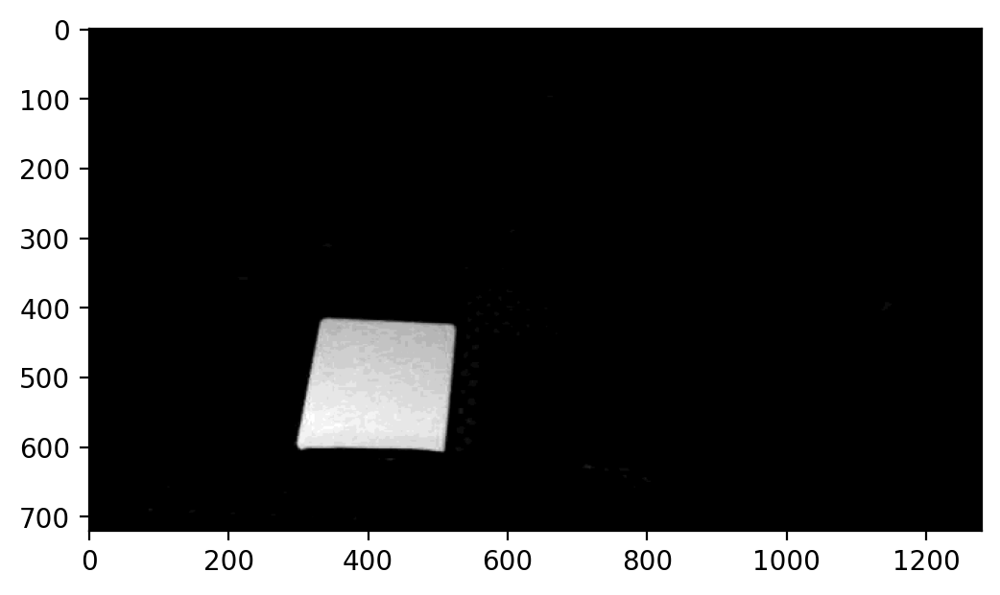

In [38]:
from PIL import Image
import os
# Read Dir with Nuance spectral image slices
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# This will be arbitrary order of spectral slices [Color checker_400.tif, Color checker_720.tif]. Thus it can be 500, 720, 420... etc, i.e. wrong order
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
dirpath = "/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable"
myDir = os.listdir(dirpath)
# Read the first image define it size, define the total number of Images and get the size of future ENVI Spectral Cube
fullpath = os.path.join(dirpath, myDir[0])
im = Image.open(fullpath) 
single_slice = numpy.array(im) # make a numpy array
[x, y] = single_slice.shape 
spectral = len(myDir)
print(x, y, spectral)

# save as integers, data type = 12
spectral_cube = numpy.ndarray(shape=(x,spectral,y), dtype=numpy.uint16)
print(spectral_cube.shape)

i=0
for file in myDir:
  fullpath = os.path.join(dirpath, file)
  print(fullpath)
  im = Image.open(fullpath) 
  single_slice = numpy.array(im)
  #print(imarray.shape)
  spectral_cube[:,i,:]=single_slice
  i = i + 1

# Save ready ENVI cube made of tiffs
saveraw = "/content/drive/MyDrive/savedata/tunable.raw"
fileobj = open(saveraw, mode='wb')
spectral_cube.tofile(fileobj)
fileobj.close()
print('Ready')
plt.imshow(spectral_cube[:,10,:], cmap='gray') #, vmin=0, vmax=3138
im.show()

In [39]:
# Read image
open_path = "/content/drive/MyDrive/savedata/tunable.raw"
samples = 1280
bands = 130
lines = 720

# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) 
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))

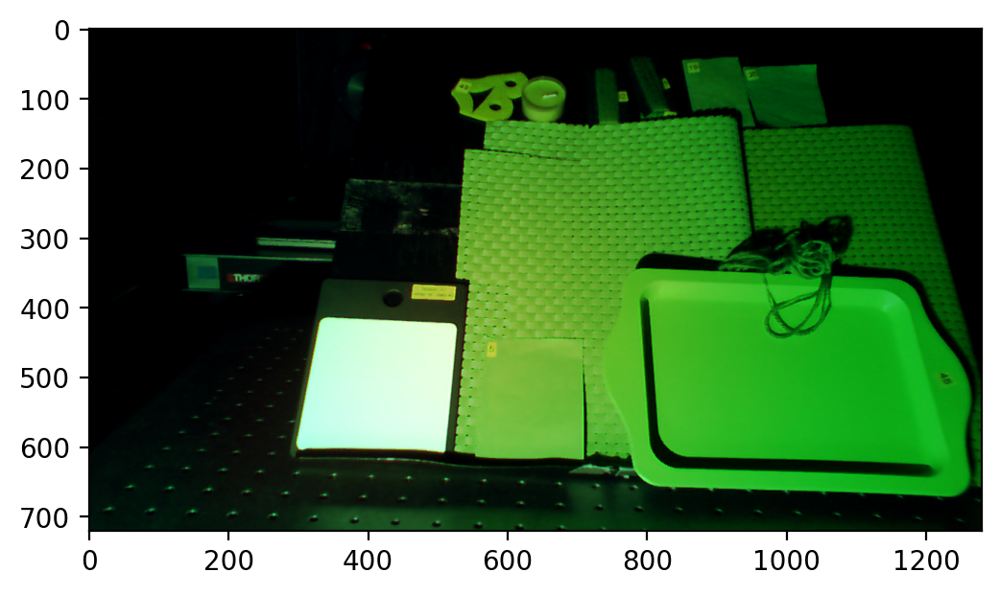

In [42]:
# Plot RGB preview
plt.rcParams['figure.dpi'] = 100
RGB = numpy.empty((lines,samples, 3), dtype = numpy.float32)
ch1 = 118 # Red
ch2 = 65  # Green
ch3 = 15  # Blue
RGB[:,:,0] = spectral_image[:,ch1,:]/ numpy.amax(spectral_image[:,ch1,:])
RGB[:,:,1] = spectral_image[:,ch2,:]/ numpy.amax(spectral_image[:,ch2,:])
RGB[:,:,2] = spectral_image[:,ch3,:]/ numpy.amax(spectral_image[:,ch3,:])
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB)
plt.show()

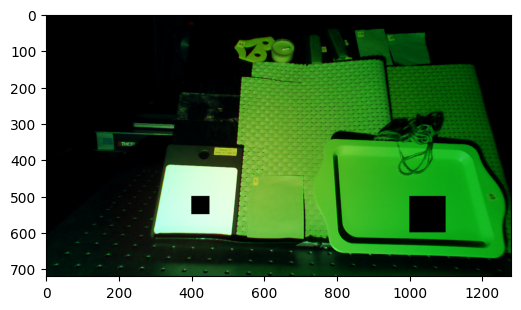

In [43]:
# Select Green
x1 = 1000
x2 = 1100
y1 = 500
y2 = 600
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
green = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))

# Select White
x1 = 400
x2 = 450
y1 = 500
y2 = 550
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
white = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
##################################################################
plt.rcParams['figure.dpi'] = 100
plt.imshow(RGB)
plt.show()

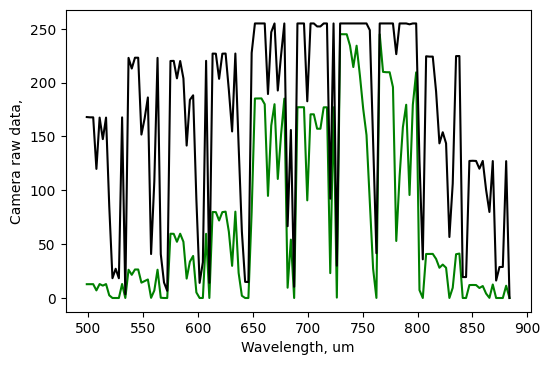

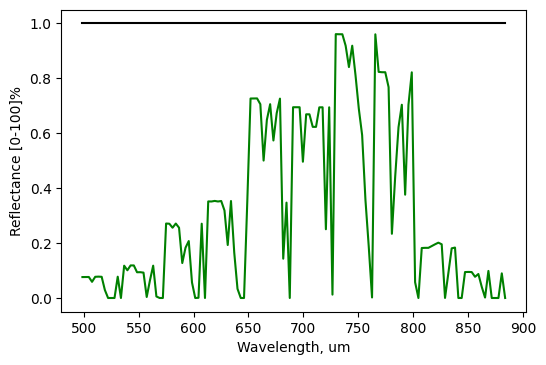

In [45]:
plt.plot(waves[:130], green[:135], "g")
plt.plot(waves[:130], white[:135], "black")

plt.rcParams['figure.dpi'] = 100
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
#plt.ylabel('Reflectance [0-100]%')
plt.show()
# spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
green_cor = green/white
white_cor = white/white
plt.rcParams['figure.dpi'] = 100

plt.plot(waves[:130], green_cor[:135], "g")
plt.plot(waves[:130], white_cor[:135], "black")
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
plt.ylabel('Reflectance [0-100]%')
plt.show()

In [46]:
# Correct all image
spectral_cube = numpy.empty((lines,bands,samples), dtype = numpy.float32)
for i in range(0,lines):
  for j in range(0,samples):
    spectral_cube[i,:,j] = spectral_image[i,:,j]/white #numpy.divide(spectral_image[i,:,j], white)

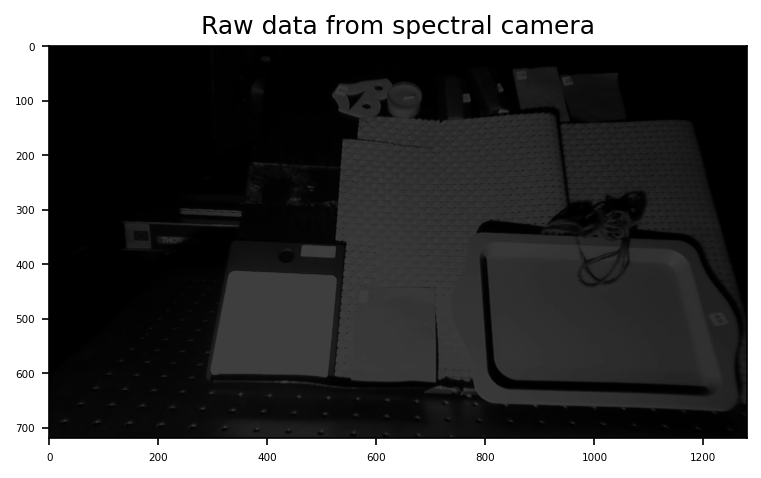

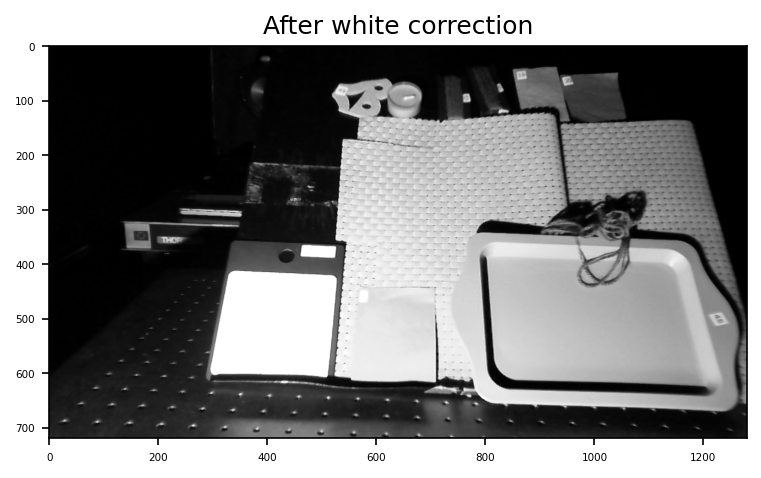

In [47]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=1050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()

plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


850.29
690.64
542.68


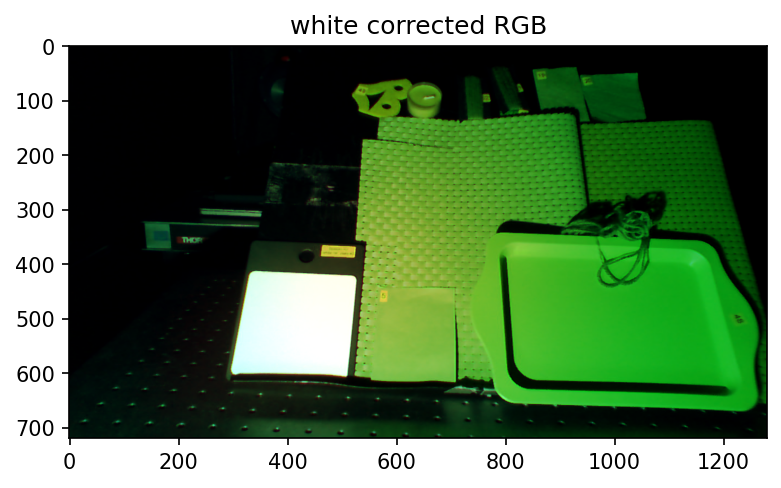

In [50]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 118
ch_2 = 65
ch_3 = 15
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.title("white corrected RGB")
plt.show()

[0.         0.         0.00448074]


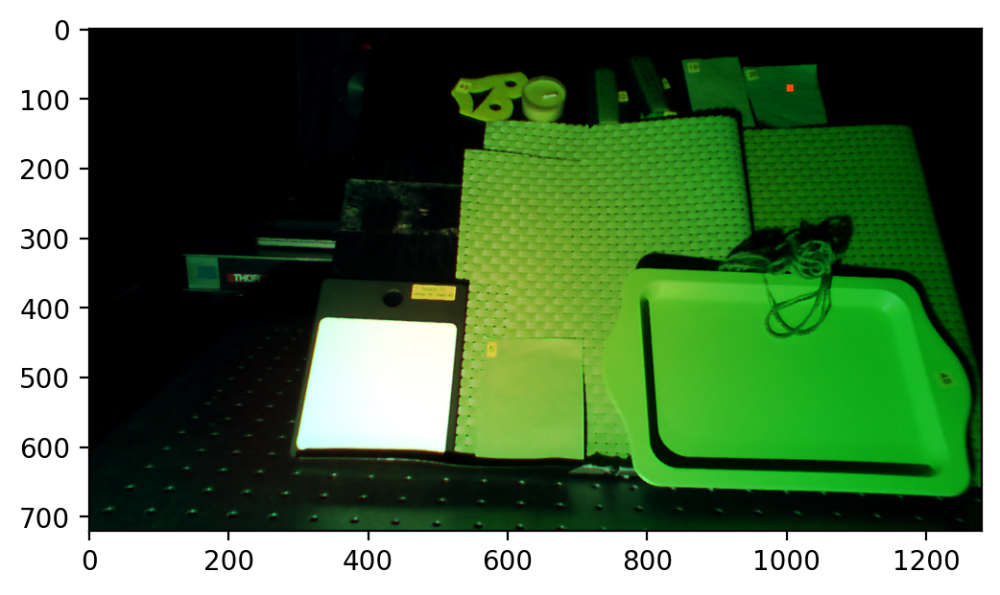

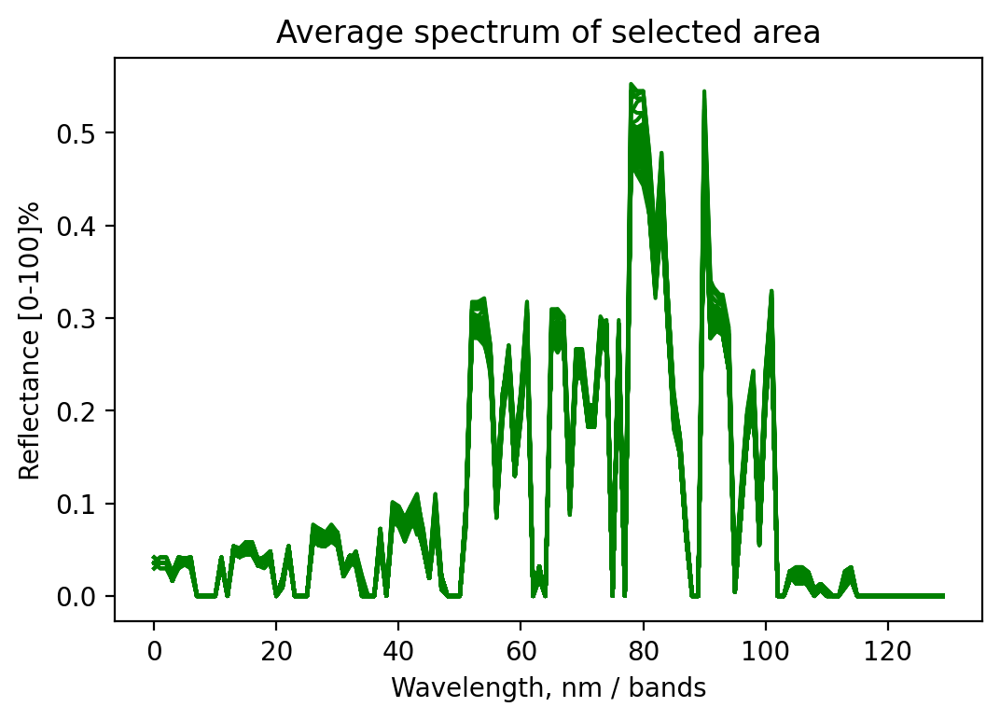

In [52]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB4 = RGB.copy()
##################################################################

# Sample 
y1 = 1000
y2 = 1010
x1 = 80
x2 = 90

plt.rcParams['figure.dpi'] = 200

RGB4[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB4)
plt.rcParams['figure.dpi'] = 200
plt.show()


plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")

for i in range(10):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)



plt.show()

# save 
saveraw = "/content/drive/MyDrive/green3_image.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()






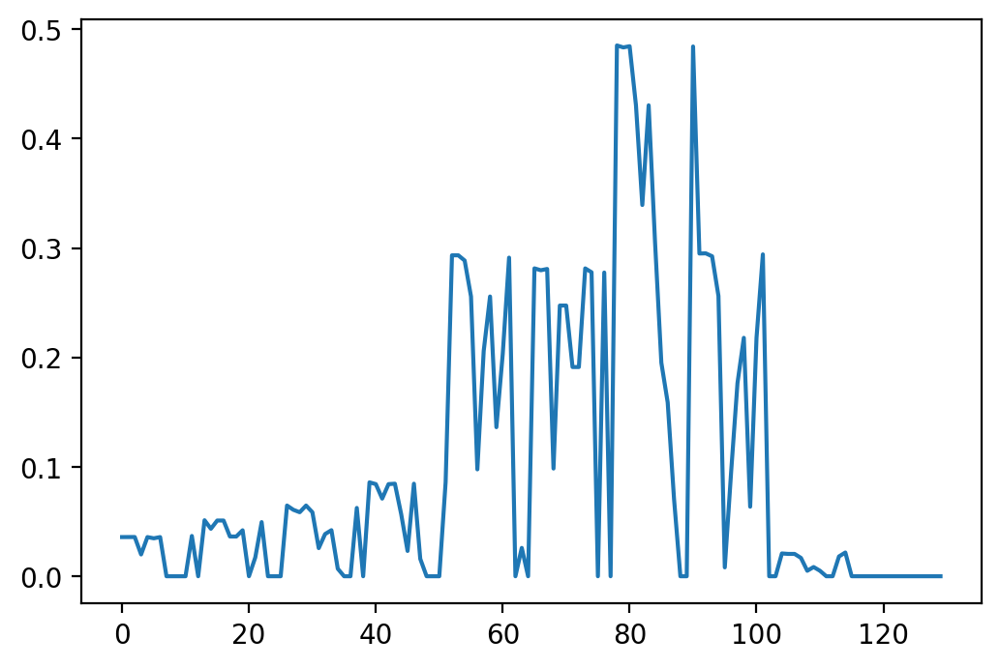

In [53]:
open_path = "/content/drive/MyDrive/green3_image.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

Now I want to segment the small green paper sample

720 130 1280
20
60
80
120
RGB:  (720, 1280, 3)
cube:  (720, 130, 1280)
small cube:  (720, 1280, 4)


1.1999804
1.0726726
1.1611377


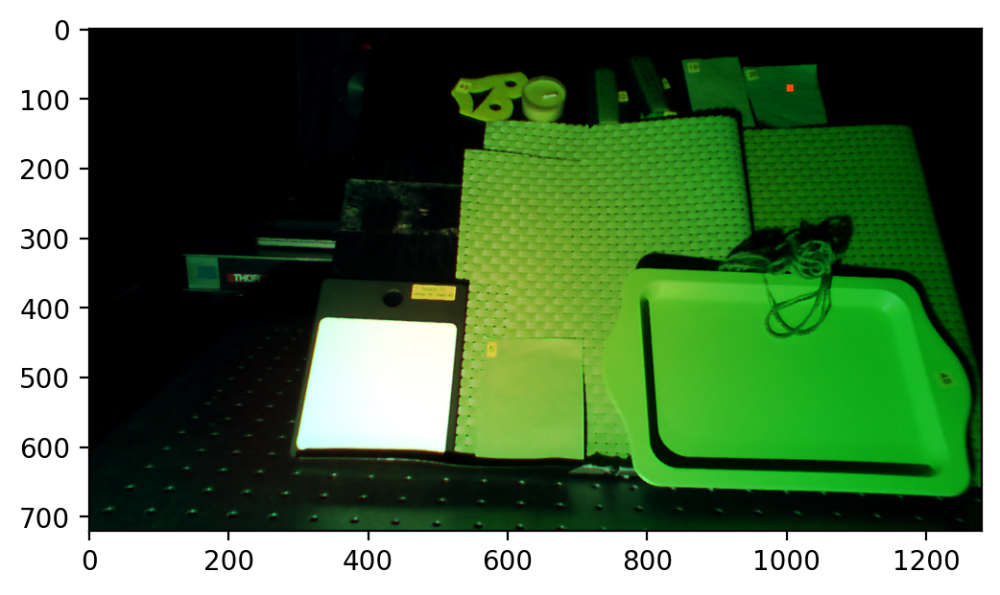

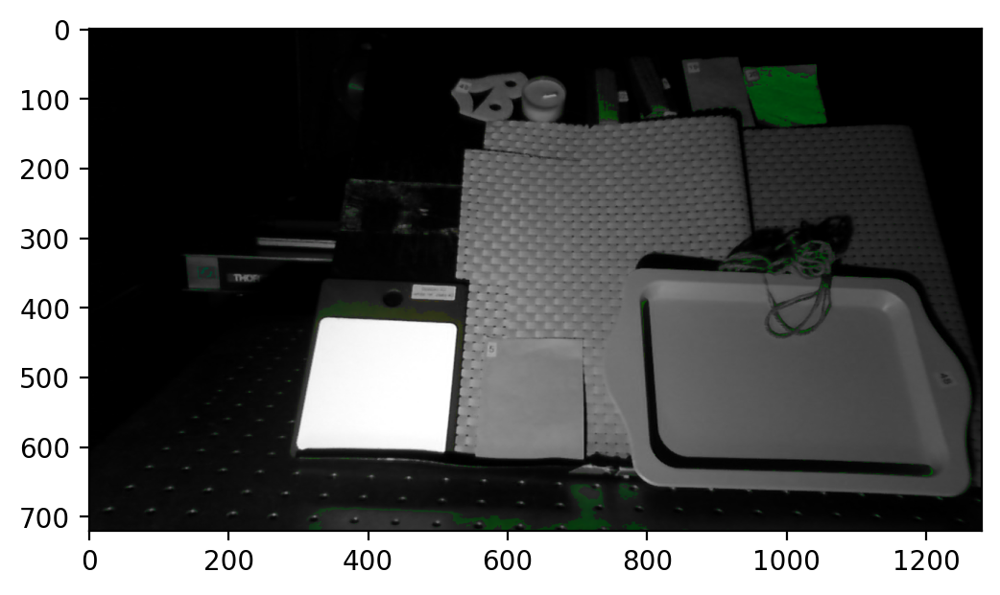

In [56]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 60
bbands[2] = 80
bbands[3] = 120

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/green3_image.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.07: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB4)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()
plt.imshow(mask)

As we can see the small grenn paper sample was successfully segmented. 

**Tasks #2. White powders** 
Now we would like to seperate white powders, just by selecting relevant bands. I will start with the sample of the visible area. First we nee to do the white correction. 

In [57]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture/vis_scan_0066.raw
2144
2144 2033 135
54
55
190
spectral_image.shape:  (2033, 135, 2144)


/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture/WHITEREF_vis_scan_0066.hdr
2144
2144 151 135
54
55
190
2144 135 151


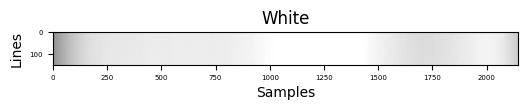

2144
2144 100 135
54
55
190


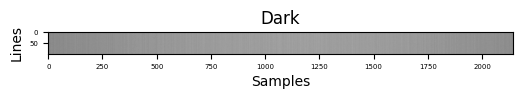

In [58]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 100
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=250)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 100
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=2)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [59]:


white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube


(2033, 135, 2144)
(2033, 135, 2144)


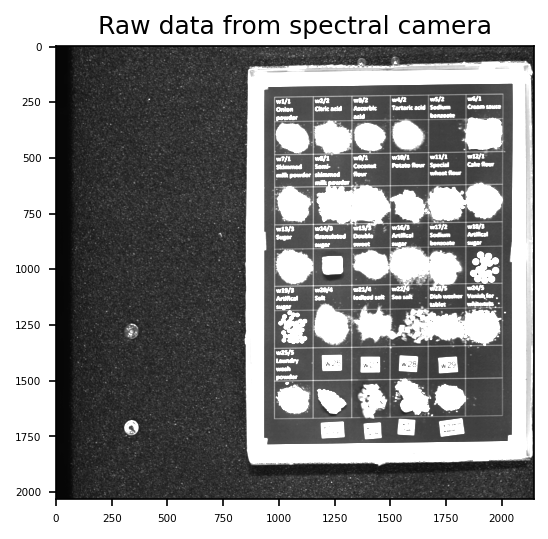

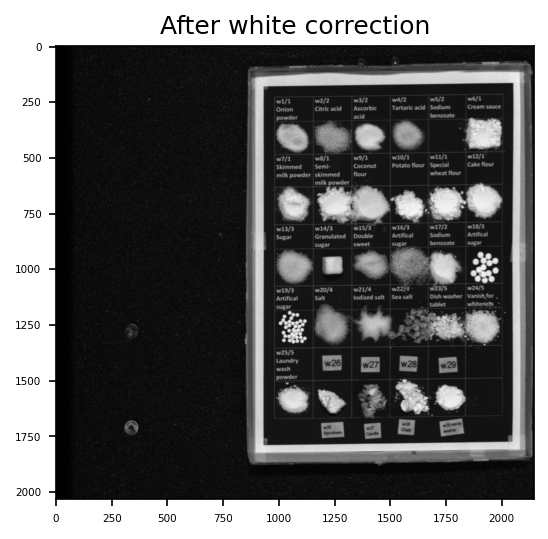

In [60]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()




686.35
579.81
460.29


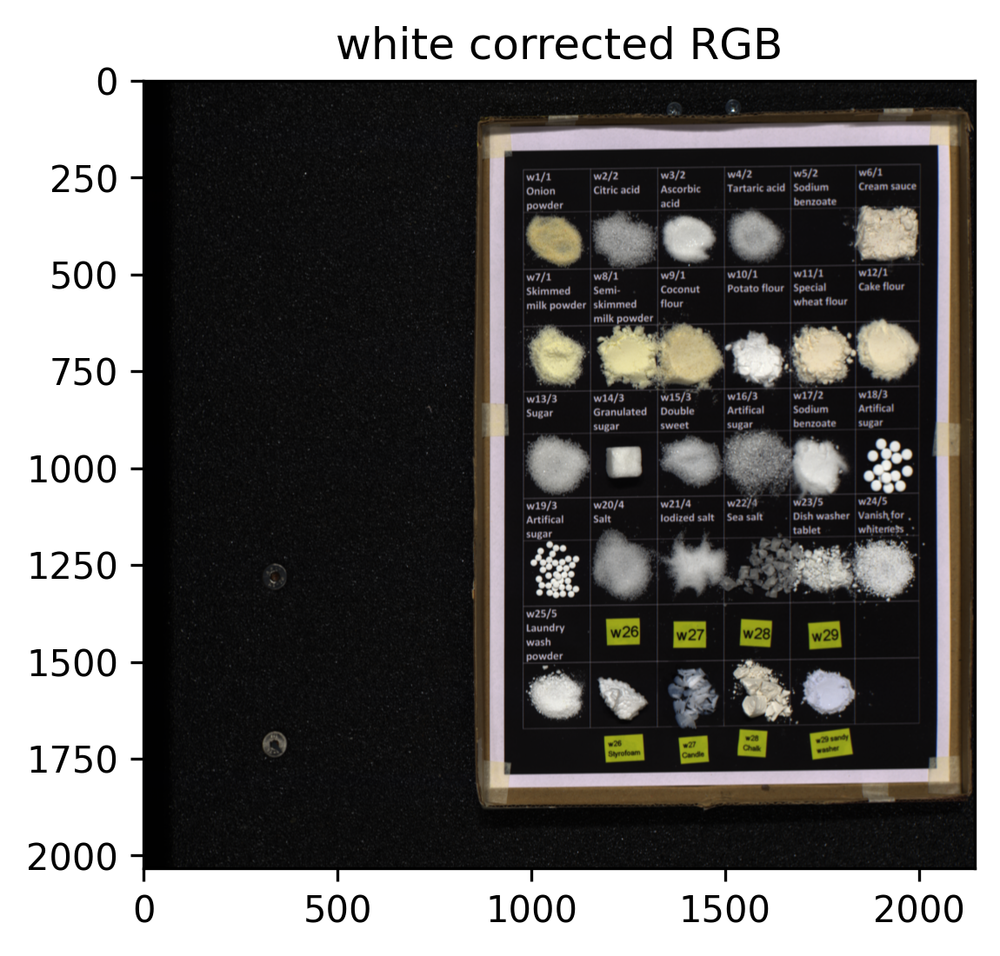

In [62]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 73
ch_2 = 52
ch_3 = 28
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.title("white corrected RGB")
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

The White correction is done. Next, I will select some powders to see their spectral distribution.

[0.02962223 0.02970313 0.03455839]


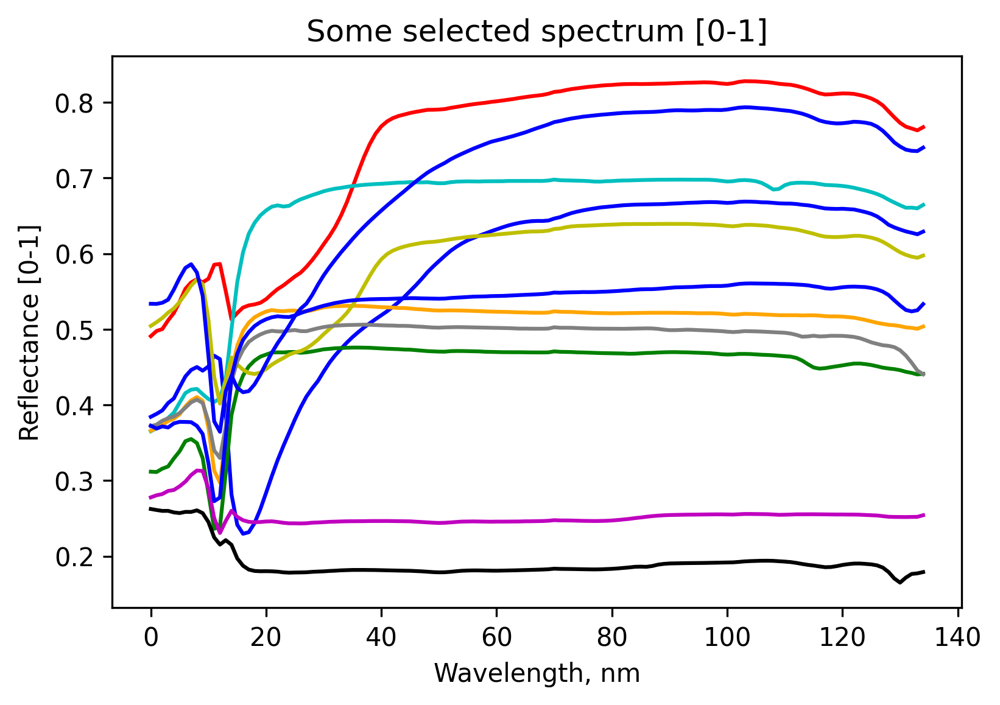

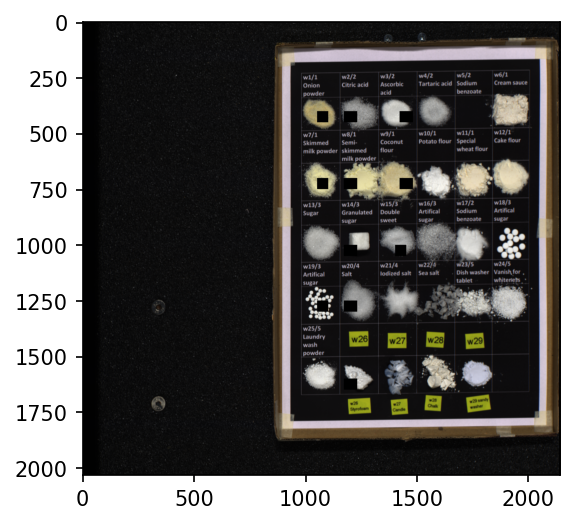

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [63]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 1, Onion Powder
y1 = 1050
y2 = 1100
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################
# Select 2,Sugar
y1 = 1050
y2 = 1100
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'r') 

##################################################################
# Select 3, Artificial Sugar
y1 = 1400
y2 = 1450
x1 = 1000
x2 = 1050 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'g')

##################################################################
# Select 4, Laundry wash powder
y1 = 1050
y2 = 1100
x1 = 1250
x2 = 1300 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'c')

##################################################################
# Select 5, Candle
y1 = 1170
y2 = 1230
x1 = 1600
x2 = 1650 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'m') 

##################################################################
# Select 6, w26
y1 = 1170
y2 = 1230
x1 = 1250
x2 = 1300 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'orange') 

##################################################################
# Select 7, Salt
y1 = 1170
y2 = 1230
x1 = 1000
x2 = 1050 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'black') 

##################################################################
# Select 8, Gran. Sugar
y1 = 1170
y2 = 1230
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'y') 

##################################################################
# Select 9, Citric Acid
y1 = 1170
y2 = 1230
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'grey') 

# Select 10, Coconut
y1 = 1420
y2 = 1480
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

# Select 11, Double sweet
y1 = 1420
y2 = 1480
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 


plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


Based on the spectra I try to select relevant bands to seperate the powders. This is more trial an error, since the spectra are similar. I achieved the best result with the following bands. 

470.16
878.5
984.73


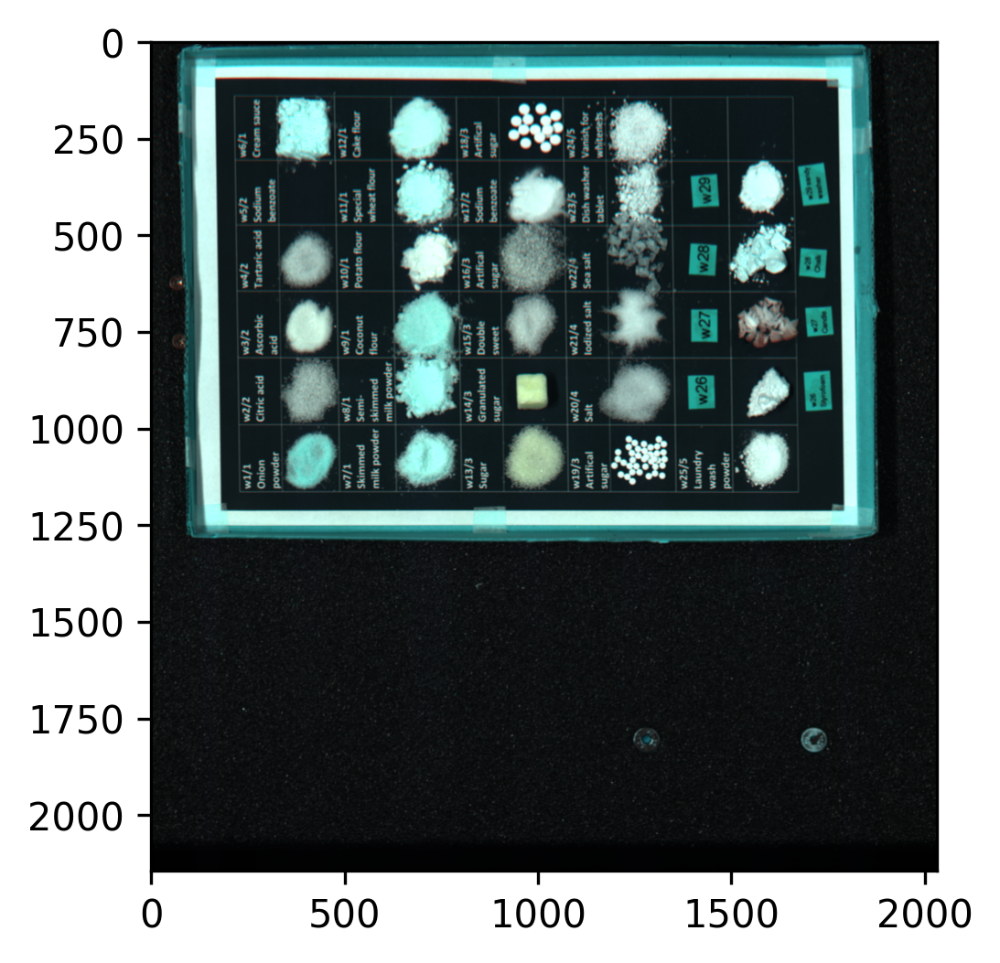

In [67]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 4), dtype=numpy.float32)

# Good 80,160,22 or  90 160 220
ch_1 = 30#90

ch_2 = 110#170

ch_3 = 130#220


print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])


#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]

plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

Eventhoug we can see some differences (e.g. sugar vs. salt), the result is not that good. Next, we will try it with IR samples. First we are doing the white correction again. 

In [68]:
# Read hdr
path = "/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture/IR-green_scan_0109.raw
320
320 424 256
45
46
302
spectral_image.shape:  (424, 256, 320)


/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture/WHITEREF_IR-green_scan_0109.hdr
320
320 223 256
45
46
302
320 256 223


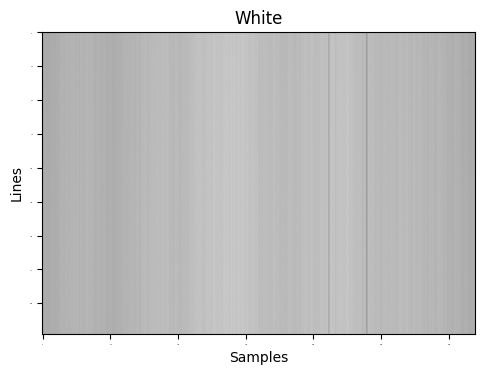

320
320 100 256
45
46
302


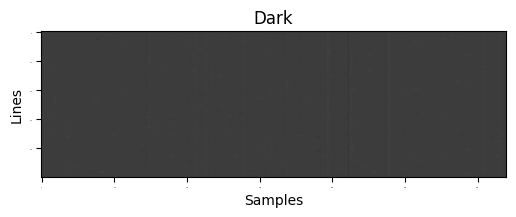

In [69]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 100
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=85)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=1)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 100
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=40)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=1)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [70]:


white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube




(424, 256, 320)


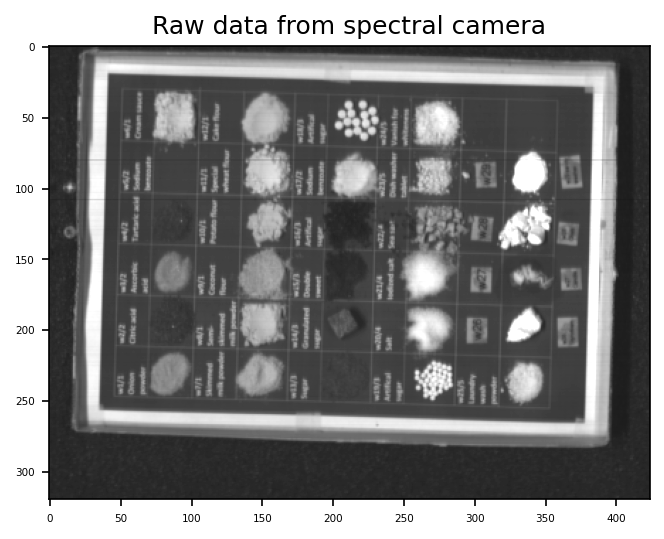

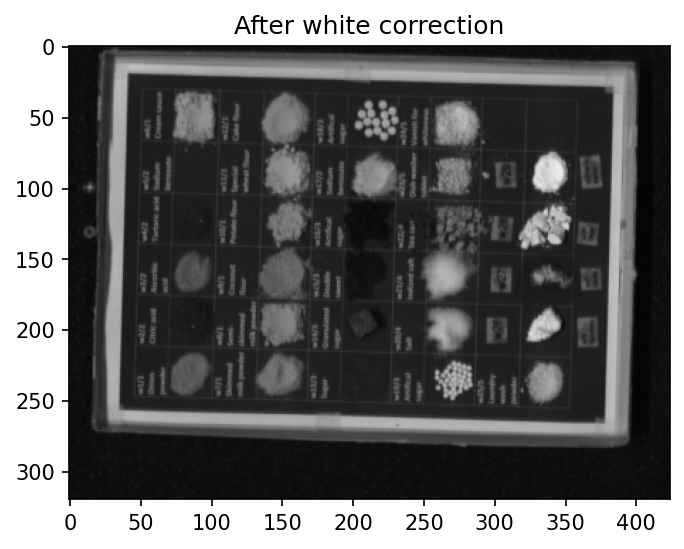

In [71]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(numpy.rot90(spectral_image[:,100,:]), cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(numpy.rot90(spectral_cube[:,100,:]), cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()


2373.63
2025.87
1616.51


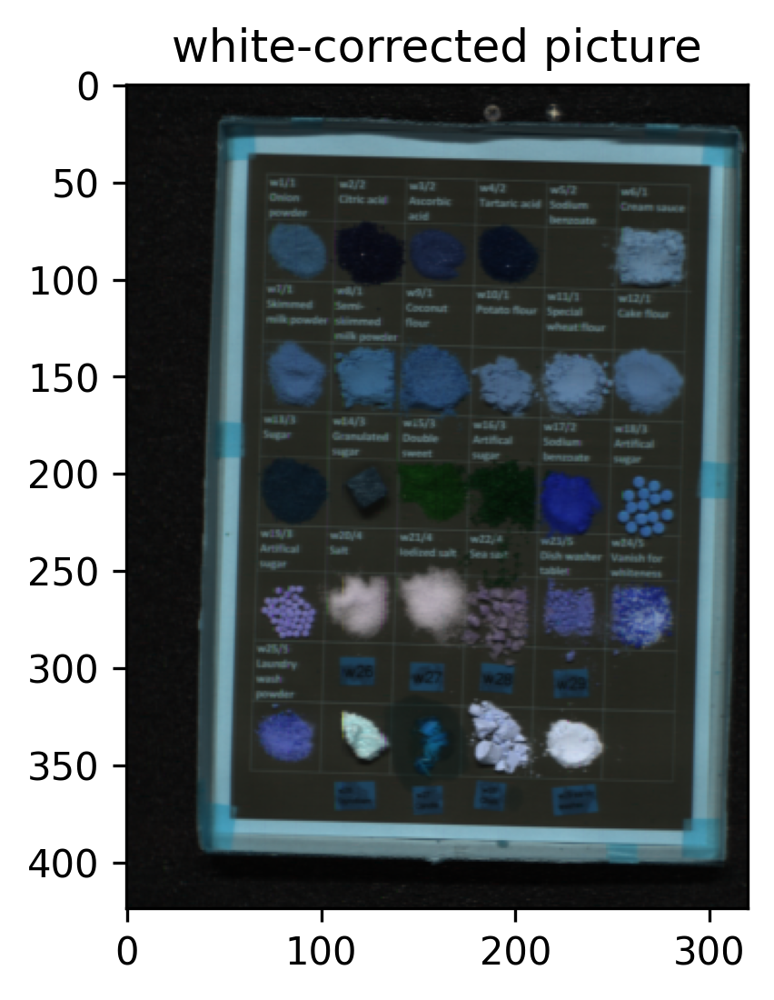

In [73]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 230
ch_2 = 175
ch_3 = 110
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.title("white-corrected picture")
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

The White correction is done. Next, I will again select some powders to see their spectral distribution.

[0.15913507 0.15208034 0.13172625]


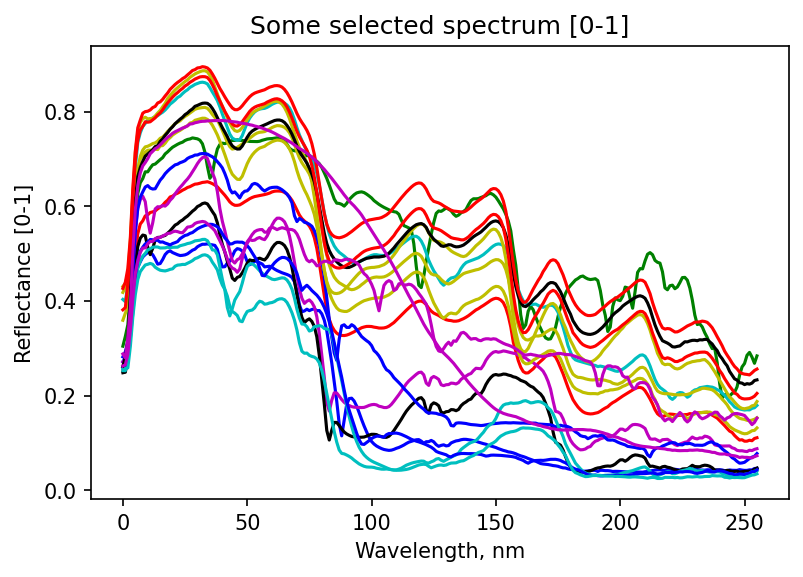

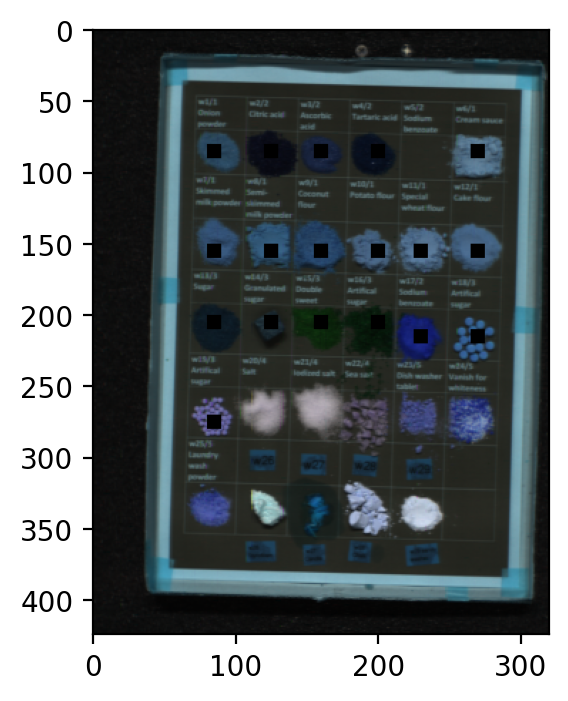

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [75]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 
x1 = 80
x2 = 90
y1 = 120
y2 = 130
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 
##################################################################
# Select 
x1 = 270
x2 = 280
y1 = 80
y2 = 90
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'g') 
##################################################################
# Select 
x1 = 80
x2 = 90
y1 = 80
y2 = 90
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 
##################################################################
# Select 
x1 = 150
x2 = 160
y1 = 120
y2 = 130 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 
##################################################################
# Select
x1 = 200
x2 = 210
y1 = 120
y2 = 130 
RGB2[x1:x2,y1:y2,0] = 0 # Make RGB black to see selection
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2] # crop spectral cube
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1)) # devide by the number of pixels in selection
plt.plot(selection2, 'm') 
##################################################################

# Select
x1 = 150
x2 = 160
y1 = 80
y2 = 90 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 
##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 80
y2 = 90 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(selection2, 'k') 
##################################################################

# Select 
x1 = 80
x2 = 90
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 

##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 

##################################################################

# Select 
x1 = 80
x2 = 90
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 

##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 

# Select 
x1 = 80
x2 = 90
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'k') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 210
x2 = 220
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 225
y2 = 235  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 210
x2 = 220
y1 = 225
y2 = 235  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm')

plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


Based on the spectra I try to select relevant bands to seperate the powders. This time thre are plenty of good bands, since the spectra are different. I achieved the best result with the following bands. 

1427.32
1994.35
2310.2


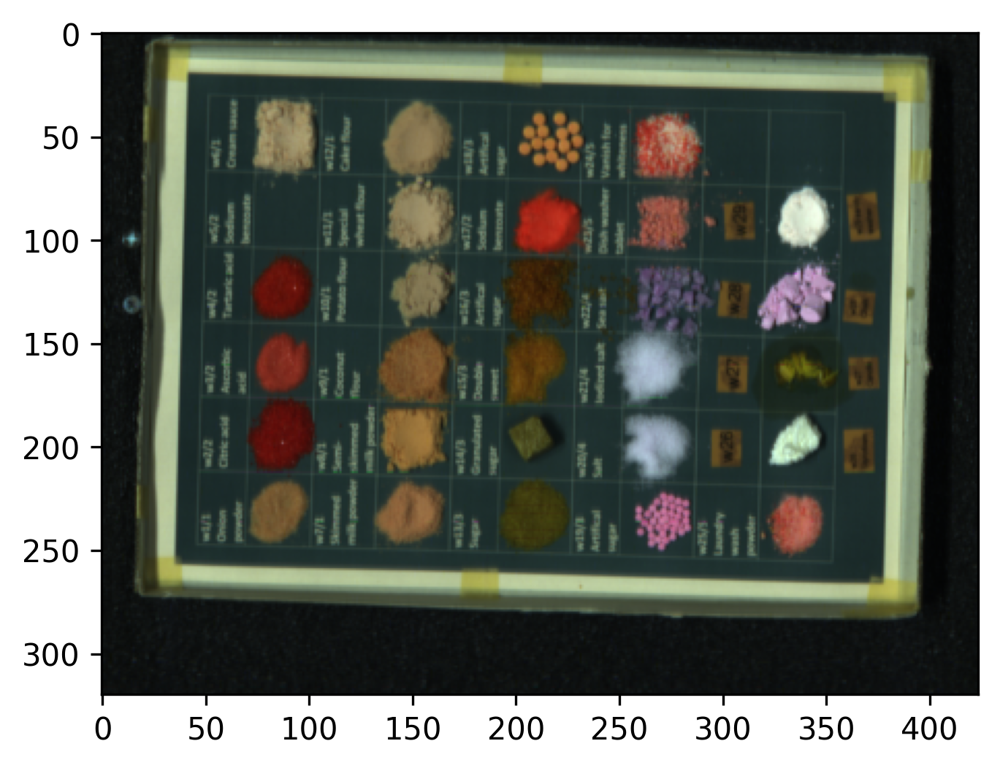

In [76]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)

ch_1 = 80

ch_2 = 170

ch_3 = 220



print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

Compared to the result in the visible area, this time we have successfully seperated the powders from each other. 

**Tasks #3. Plastic green leaves**Try using the same methods as in #1 and #2 to segment/highlight leaves made of different materials. I decided to do it with the IR. But first again the white correction
 

In [77]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture/IR-green_scan_0075.raw
320
320 590 256
45
46
302
spectral_image.shape:  (590, 256, 320)


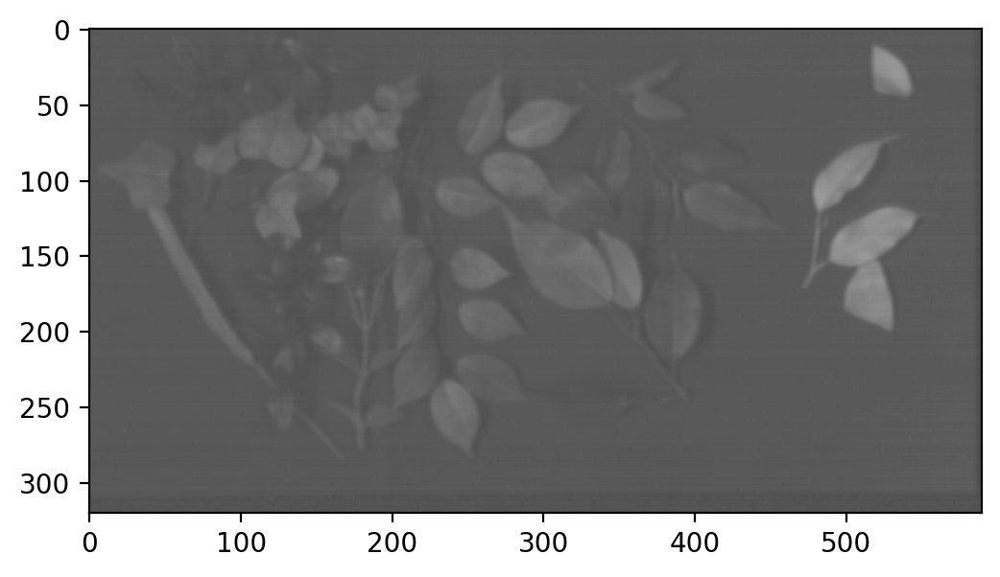

In [81]:
# Plot picture and spectrum

plt.rcParams['figure.dpi'] = 200

#fig.suptitle('Spectral cube slice and single spectrum')
img = spectral_image[:,22,:]
# pale with selected band and vmax=4700
plt.imshow(numpy.rot90(img), cmap="gray", vmin=0, vmax=3700)#
plt.show()


/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture/WHITEREF_IR-green_scan_0075.hdr
320
320 297 256
45
46
302
320 256 297


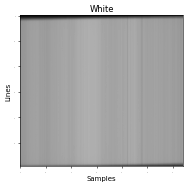

320
320 100 256
45
46
302


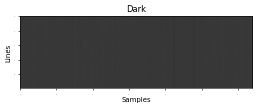

In [82]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 50
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=80)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=1)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 50
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=50)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=1)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [83]:

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube




(590, 256, 320)


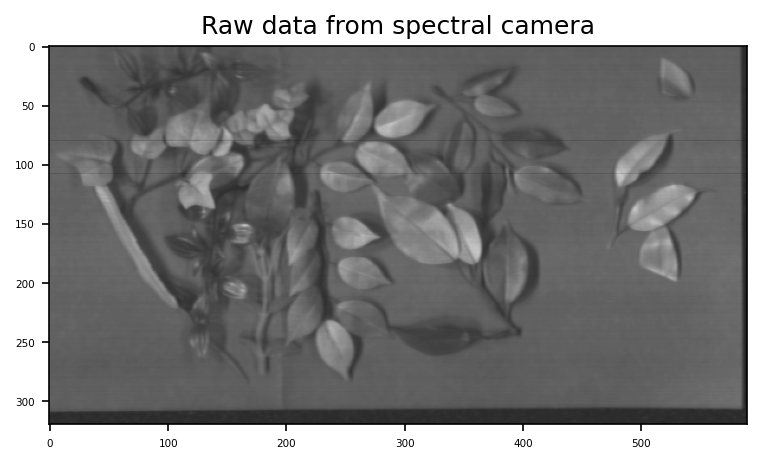

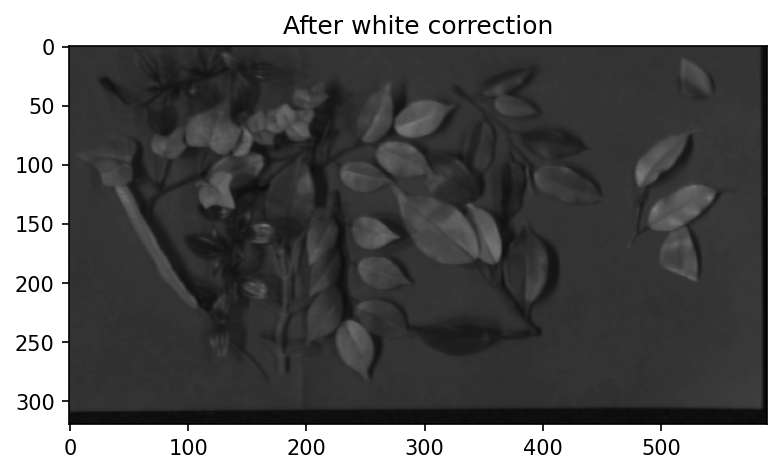

In [84]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(numpy.rot90(spectral_image[:,100,:]), cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(numpy.rot90(spectral_cube[:,100,:]), cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()


1427.32
1994.35
2246.88


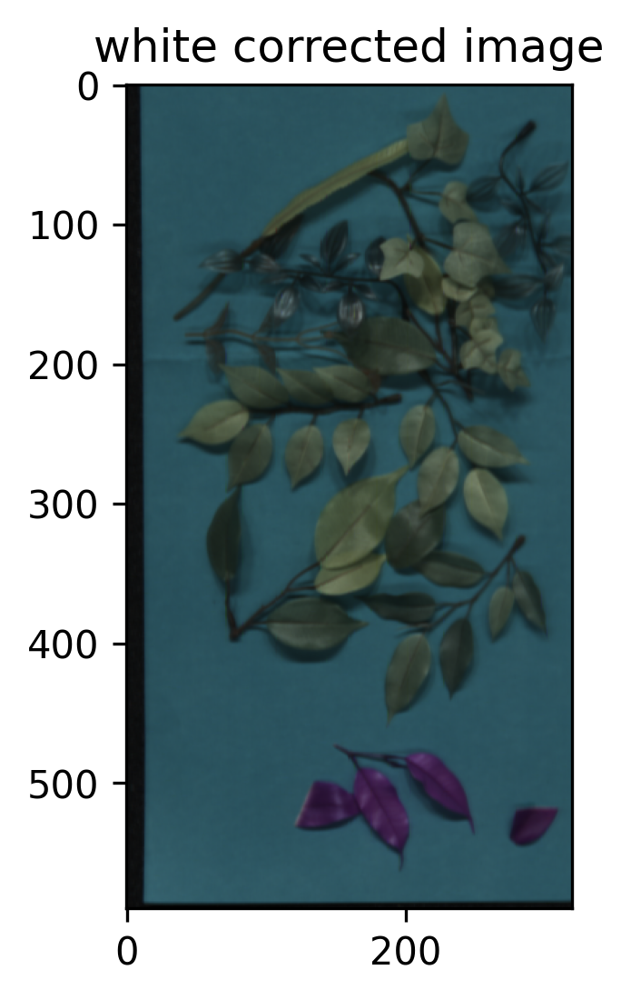

In [86]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 80
ch_2 = 170
ch_3 = 210
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.title("white corrected image")
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

Now I am making a copy for each segmentation method and try to mask out the real leaves.

In [87]:
RGBseg1 = RGB.copy()
RGBseg2 = RGB.copy()

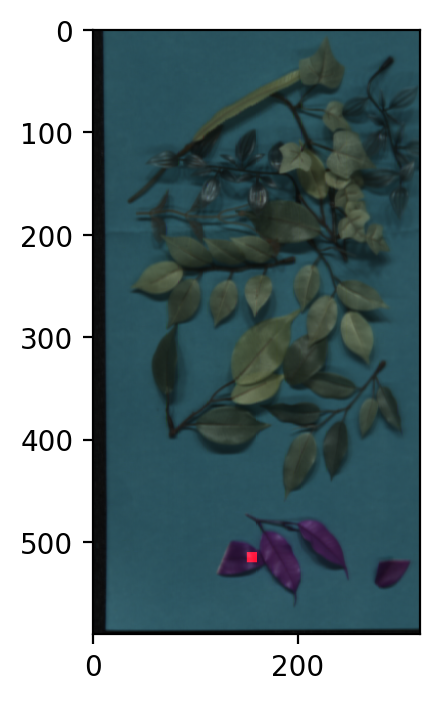

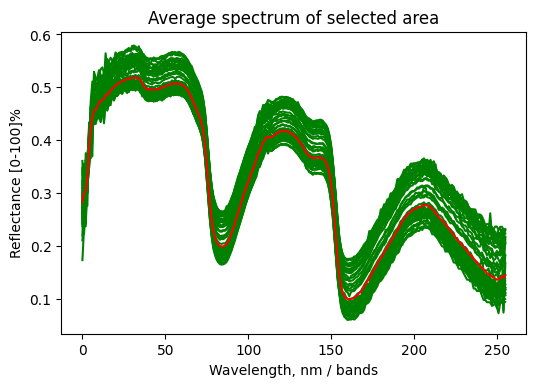

In [88]:
# Selct area and plot its avearage spectrum
##################################################################

# 
x1 = 510
x2 = 520
y1 = 150
y2 = 160

plt.rcParams['figure.dpi'] = 200

RGBseg1[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGBseg1)
plt.rcParams['figure.dpi'] = 100
plt.show()

for i in range(5):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)

plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")


plt.show()

# save 
saveraw = "/content/drive/MyDrive/savedata/green_leavesseg1_image.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()


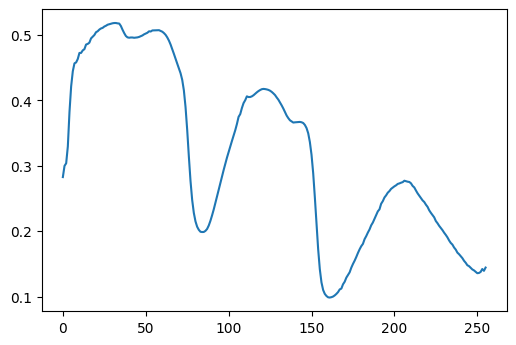

In [89]:
open_path = "/content/drive/MyDrive/savedata/green_leavesseg1_image.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

590 256 320
30
50
130
200
RGB:  (590, 320, 3)
cube:  (590, 256, 320)
small cube:  (590, 320, 4)


0.61843324
0.46340847
0.5086373


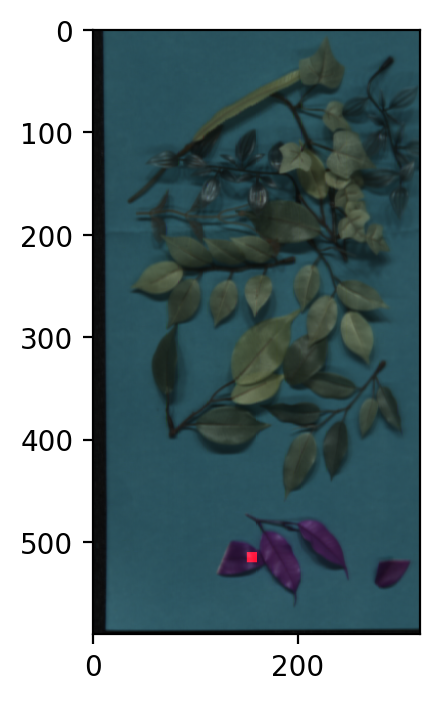

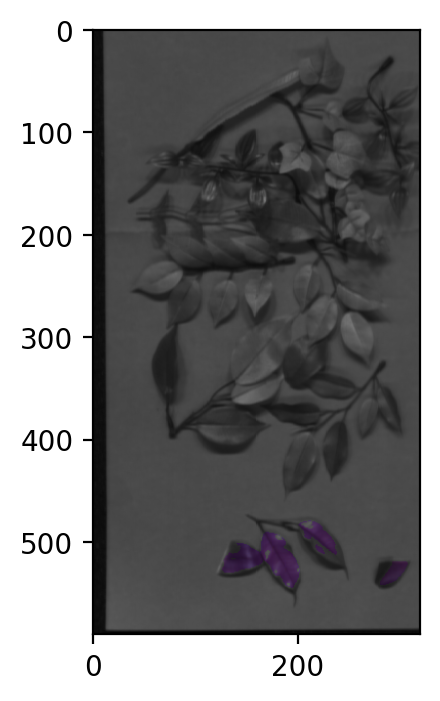

In [90]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 30
bbands[1] = 50
bbands[2] = 130
bbands[3] = 200

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/savedata/green_leavesseg1_image.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.09: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGBseg1)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()
plt.imshow(mask)


As we cann see, only the real leaves appear.
Now, we will find out if the second method works also. 

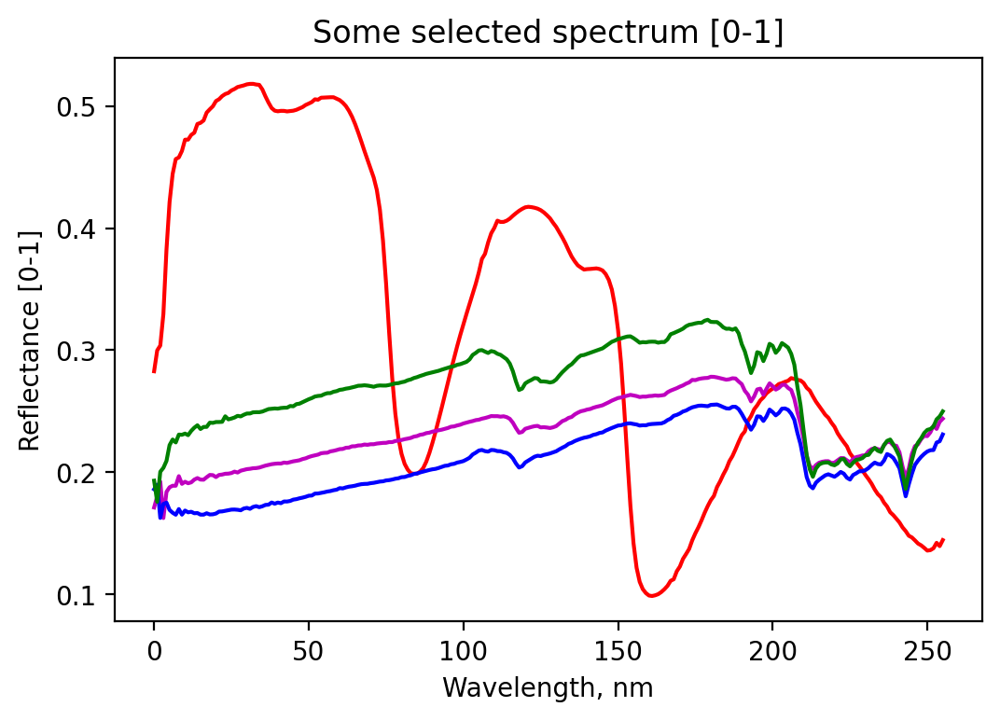

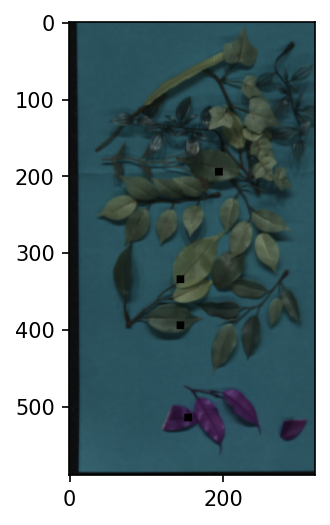

In [91]:
# Select 
x1 = 510
x2 = 520
y1 = 150
y2 = 160
RGBseg2[x1:x2,y1:y2,0] = 0
RGBseg2[x1:x2,y1:y2,1] = 0
RGBseg2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 190
x2 = 200
y1 = 190
y2 = 200  
RGBseg2[x1:x2,y1:y2,0] = 0
RGBseg2[x1:x2,y1:y2,1] = 0
RGBseg2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm')

##################################################################
# Select 
x1 = 390
x2 = 400
y1 = 140
y2 = 150  
RGBseg2[x1:x2,y1:y2,0] = 0
RGBseg2[x1:x2,y1:y2,1] = 0
RGBseg2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'b')

##################################################################
# Select 
x1 = 330
x2 = 340
y1 = 140
y2 = 150  
RGBseg2[x1:x2,y1:y2,0] = 0
RGBseg2[x1:x2,y1:y2,1] = 0
RGBseg2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'g')


plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGBseg2)
plt.show()


Out of the 4 spectra we can see big difference between the (green, pink, blue vs. the red spectra) Next we select important bands to segment them

1174.05
1490.44
1931.35


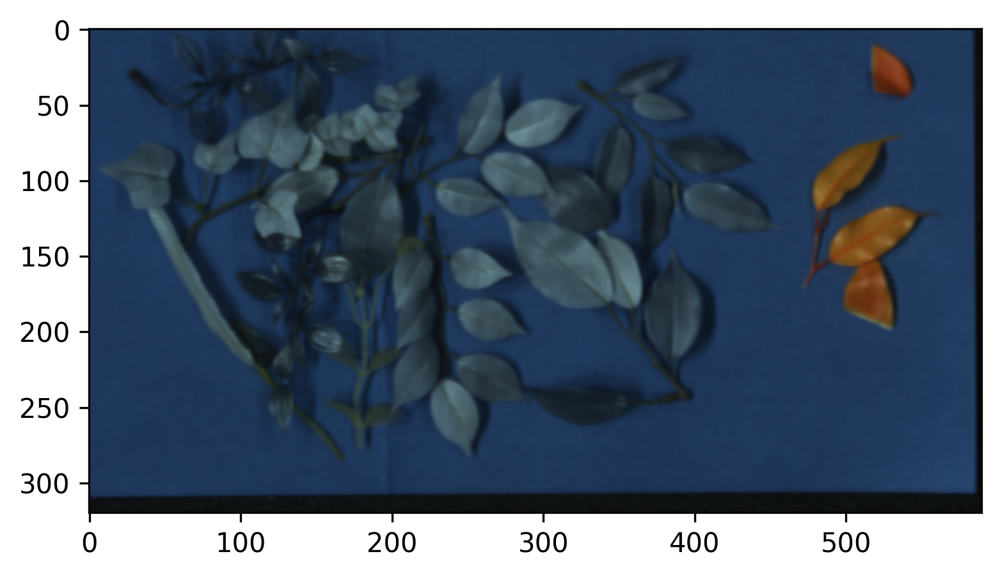

In [92]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)

ch_1 = 40

ch_2 = 90

ch_3 = 160



print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

The result is even better as with the mask. 